In [3]:
import pandas as pd
import numpy as np
import scipy.stats as st
import seaborn as sns
import sys
import os
import gseapy as gp
import pdb
import copy
from scipy import sparse
import anndata
import cerberus
import plotly.io as pio


p = os.path.dirname(os.path.dirname(os.path.dirname(os.path.dirname(os.getcwd()))))
sys.path.append(p)

from scripts.utils import *
from scripts.plotting import *

In [4]:
h_h5 = '../cerberus_annot_triplets.h5'
m_h5 = '../../../../mouse/lr_bulk/triplets/cerberus_annot_triplets.h5'
filt_ab = '../../cerberus_filtered_abundance.tsv'
gene_subset = ['protein_coding']

In [15]:
def human_v_mouse_sectors(h_h5, m_h5, h_source, m_source, 
                          h_subset=None,
                          m_subset=None,
                          gene_subset=None, 
                          h_ver='v40_cerberus',
                          m_ver='vM25_cerberus',
                          ofile='figures/human_mouse_triplets_sankey.pdf'):
    """
    Compare and plot sets of triplets between human and mouse
    
    Parameters:
        h_h5 (str): Path to human h5 file
        m_h5 (str): Path to mouse h5 file
        h_source (str): Name of source to use for human
        m_source (str): Name of source to use for mouse
        h_subset (dict): Names of samples to use in human ie {'sample': 'c2c12'}
        m_subset (dict): Names of samples to use in mouse ie {'tissue': 'cortex'}
        gene_subset (list of str): Gene biotypes to include
        h_ver (str): Name of annotation from human to pull biotypes from
        m_ver (str): Name of annotation from mouse to pull biotypes from
        
    """
    # read in triplets and limit to source
    ca = cerberus.read(h_h5)
    h_df = ca.triplets.loc[ca.triplets.source == h_source]

    ca = cerberus.read(m_h5)
    m_df = ca.triplets.loc[ca.triplets.source == m_source]    
    
    def subset_on_dict(df, subset):
        for col, val in subset.items():
                if type(val) != list:
                    val = [val]
                df = df.loc[df[col].isin(val)]
        return df
                
    # limit to samples if given
    if h_subset:
        h_df = subset_on_dict(h_df, h_subset)
    if m_subset:
        m_df = subset_on_dict(m_df, m_subset)

    # get sectors for each gene
    h_df = assign_gisx_sector(h_df)
    m_df = assign_gisx_sector(m_df)
                    
    # merge in gene info and subset
    if gene_subset:
        gene_df, _, _ = get_gtf_info(how='gene', ver=h_ver)
        gene_df['gid'] = cerberus.get_stable_gid(gene_df, 'gid')
        h_df = h_df.merge(gene_df[['gid', 'biotype_category']],
                          how='left', on='gid')
        
        gene_df, _, _ = get_gtf_info(how='gene', ver=m_ver)
        gene_df['gid'] = cerberus.get_stable_gid(gene_df, 'gid')
        m_df = m_df.merge(gene_df[['gid', 'biotype_category']],
                          how='left', on='gid')
        
        h_df = h_df.loc[h_df.biotype_category.isin(gene_subset)]
        m_df = m_df.loc[m_df.biotype_category.isin(gene_subset)]
    
    # get matching gids from human and mouse
    df = pd.read_csv('../../../../refs/biomart_human_to_mouse.tsv', sep='\t')
    
    # drop nans in either mouse or human
    df = df.loc[~df['Gene stable ID'].isnull()]
    df = df.loc[~df['Mouse gene stable ID'].isnull()]
    
    # drop dupes that are duplicated in both the human and mouse id (from transcripts)
    df = df[['Gene stable ID', 'Mouse gene stable ID']]    
    df = df.drop_duplicates()
    
    # merge human and mouse triplets in too
    df = df.merge(h_df, how='right', left_on='Gene stable ID',
                  right_on='gid')
        
    df = df.merge(m_df, how='right', left_on='Mouse gene stable ID',
                  right_on='gid', suffixes=('_human', '_mouse'))
    
    # get only genes that are both expressed
    df = df.loc[~(df.sector_human.isnull())&~(df.sector_mouse.isnull())]
    
    # count up instances of each sector pair
    df = df[['Gene stable ID', 'sector_human', 'sector_mouse']].groupby(['sector_human', 'sector_mouse']).count().reset_index()
    df.rename({'Gene stable ID': 'n_genes'}, axis=1, inplace=True)                  
    
    # display some stuff
    print('Total number of human genes / sector')
    print(df.groupby(['sector_human']).sum().reset_index()[['sector_human', 'n_genes']])

    print('Total number of mouse genes / sector')
    print(df.groupby(['sector_mouse']).sum().reset_index()[['sector_mouse', 'n_genes']])
    
    print('Total number of conserved genes / sector')
    temp = df.loc[df.sector_human==df.sector_mouse].groupby('sector_human').sum().reset_index()[['sector_human', 'n_genes']]
    temp2 = df.groupby(['sector_human']).sum().reset_index()[['sector_human', 'n_genes']]
    temp2.rename({'n_genes': 'n_total_genes'}, axis=1, inplace=True)
    temp = temp.merge(temp2, on='sector_human')
    temp['perc'] = (temp.n_genes/temp.n_total_genes)*100
    print(temp)

    fig = plot_sankey(df,
                  source='sector_human',
                  sink='sector_mouse',
                  counts='n_genes',
                  color='sector',
                  title='')
    pio.write_image(fig, ofile, width=700, height=700)
    
    n_genes = df.n_genes.sum(axis=0)
    n_cons_genes = df.loc[df.sector_human == df.sector_mouse].n_genes.sum(axis=0)
    print('{}/{} ({:.2f}%) of genes have conserved sectors between human and mouse.'.format(n_cons_genes, n_genes, (n_cons_genes/n_genes)*100))
    
    return df

Total number of human genes / sector
  sector_human  n_genes
0        mixed     6798
1       simple     2248
2     splicing     1176
3          tes     3663
4          tss     1373
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     6878
1       simple     2349
2     splicing      941
3          tes     3443
4          tss     1647
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     3418           6798  50.279494
1       simple      812           2248  36.120996
2     splicing      243           1176  20.663265
3          tes     1513           3663  41.304941
4          tss      406           1373  29.570284
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

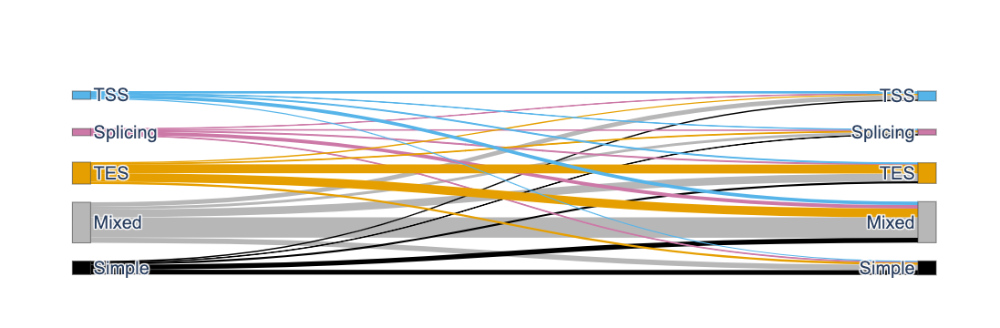

6392/15258 (41.89%) of genes have conserved sectors between human and mouse.


In [6]:
# major isoform triplets mouse match 
h_source = 'obs_mm_major'
m_source = 'obs_major'
fig_dir = '/Users/fairliereese/Documents/programming/mortazavi_lab/documents/rnawg/fig5/'

df = human_v_mouse_sectors(h_h5,
                      m_h5,
                      h_source,
                      m_source,
                      gene_subset=gene_subset,
                      ofile=f'{fig_dir}/obs_major_mouse_v_human_triplets_sankey.pdf')

## Adult matched tissues

Total number of human genes / sector
  sector_human  n_genes
0        mixed     4857
1       simple     2847
2     splicing      718
3          tes     1958
4          tss      671
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     3794
1       simple     5138
2     splicing      463
3          tes     1287
4          tss      369
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     2008           4857  41.342392
1       simple     1852           2847  65.050931
2     splicing      125            718  17.409471
3          tes      466           1958  23.799796
4          tss       68            671  10.134128
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

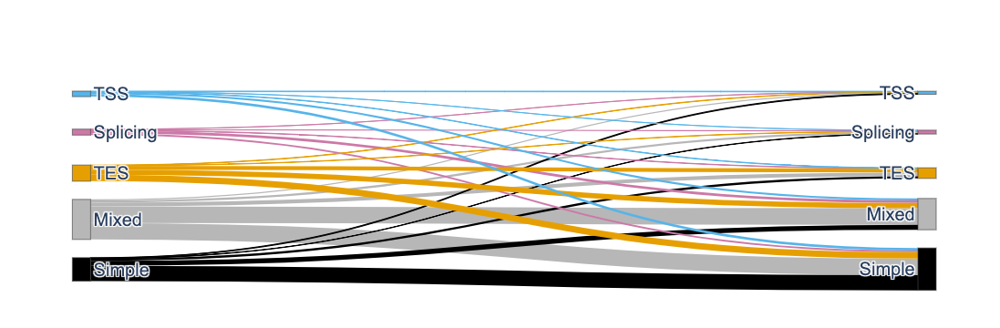

4519/11051 (40.89%) of genes have conserved sectors between human and mouse.


In [10]:
# major isoform triplets for just adult heart
h_source = 'sample_major'
m_source = 'tissue_adult_major'
h_subset = {'sample': 'heart'}
m_subset = {'tissue_adult': 'heart_True'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/heart_adult_mouse_v_human_triplets_sankey.png')

Total number of human genes / sector
  sector_human  n_genes
0        mixed     4335
1       simple     4058
2     splicing      677
3          tes     1626
4          tss      506
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     4043
1       simple     4284
2     splicing      465
3          tes     1979
4          tss      431
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     1897           4335  43.760092
1       simple     2087           4058  51.429276
2     splicing      123            677  18.168390
3          tes      571           1626  35.116851
4          tss       55            506  10.869565
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

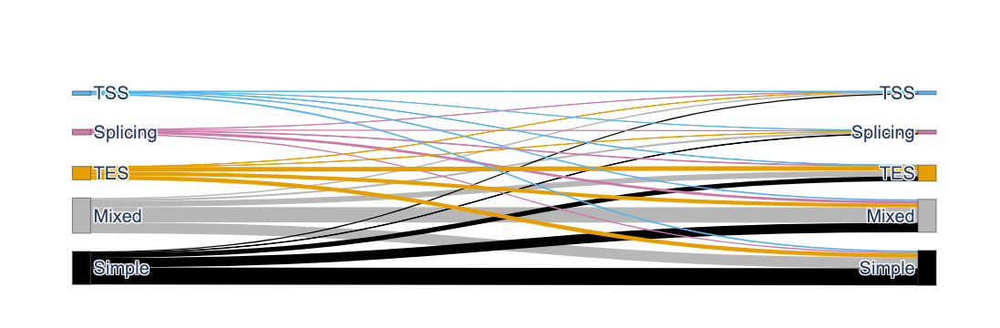

4733/11202 (42.25%) of genes have conserved sectors between human and mouse.


In [16]:
# major isoform triplets for just adult adrenal
h_source = 'sample_major'
m_source = 'tissue_adult_major'
h_subset = {'sample': 'adrenal gland'}
m_subset = {'tissue_adult': 'adrenal_True'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/adrenal_adult_mouse_v_human_triplets_sankey.png')

Total number of human genes / sector
  sector_human  n_genes
0        mixed     3621
1       simple     3596
2     splicing      578
3          tes     1232
4          tss      381
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     3153
1       simple     4123
2     splicing      555
3          tes     1265
4          tss      312
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     1498           3621  41.369787
1       simple     2074           3596  57.675195
2     splicing      132            578  22.837370
3          tes      351           1232  28.490260
4          tss       31            381   8.136483
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

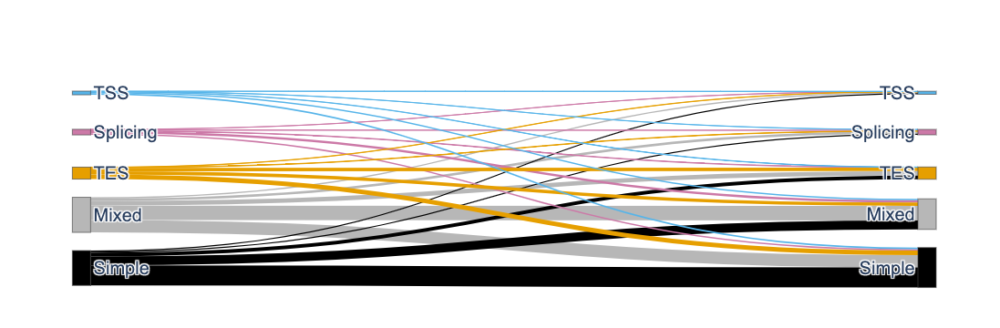

4086/9408 (43.43%) of genes have conserved sectors between human and mouse.


In [18]:
# major isoform triplets for just adult muscle
h_source = 'sample_major'
m_source = 'tissue_adult_major'
h_subset = {'sample': 'muscle'}
m_subset = {'tissue_adult': 'gastroc_True'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/muscle_adult_mouse_v_human_triplets_sankey.png')

Total number of human genes / sector
  sector_human  n_genes
0        mixed     5594
1       simple     3637
2     splicing      902
3          tes     1677
4          tss      717
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     4622
1       simple     3735
2     splicing      826
3          tes     2557
4          tss      787
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     2364           5594  42.259564
1       simple     1566           3637  43.057465
2     splicing      213            902  23.614191
3          tes      599           1677  35.718545
4          tss      111            717  15.481172
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

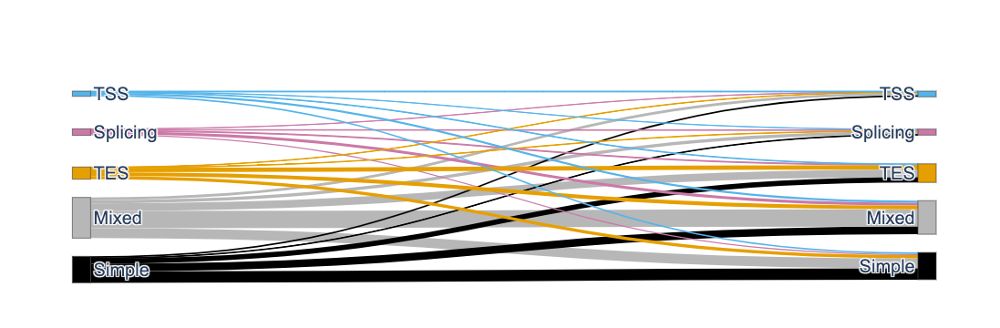

4853/12527 (38.74%) of genes have conserved sectors between human and mouse.


In [17]:
# major isoform triplets for just adult cortex
h_source = 'sample_major'
m_source = 'tissue_adult_major'
h_subset = {'sample': 'brain'}
m_subset = {'tissue_adult': 'cortex_True'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/cortex_adult_mouse_v_human_triplets_sankey.png')

## Matched samples

Total number of human genes / sector
  sector_human  n_genes
0        mixed     4176
1       simple     2991
2     splicing     1002
3          tes     1943
4          tss      413
Total number of mouse genes / sector
  sector_mouse  n_genes
0        mixed     3312
1       simple     4032
2     splicing      683
3          tes     2069
4          tss      429
Total number of conserved genes / sector
  sector_human  n_genes  n_total_genes       perc
0        mixed     1626           4176  38.936782
1       simple     1660           2991  55.499833
2     splicing      226           1002  22.554890
3          tes      762           1943  39.217705
4          tss       64            413  15.496368
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}
{'label': ['TSS', 'Splicing', 'TES', 'Mixed', 'Simple', 'TSS', 'Splicing', 'TES', 'Mixed', 'Simple'], 'color': ['#56B4E9', '#CC79A7', '#E69F00', '#b7b7b7', '#000000', '#56B4E9', '#CC79A7', '#E69F0

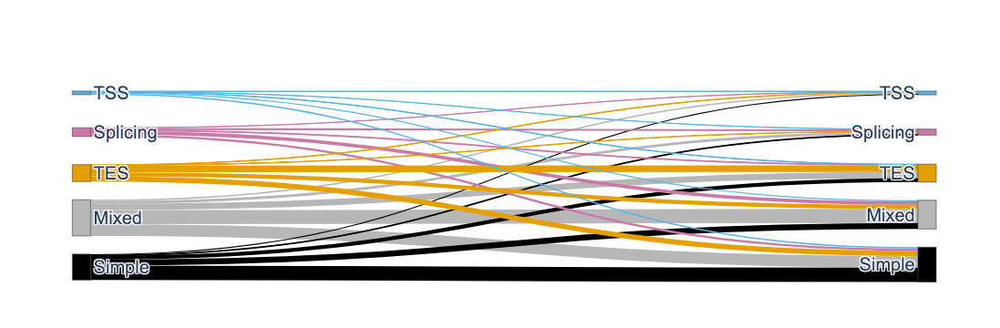

4338/10525 (41.22%) of genes have conserved sectors between human and mouse.


In [12]:
# major isoform triplets for just es
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'h1'}
m_subset = {'tissue': 'f1219'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/es_f1219_mouse_v_h1_human_triplets_sankey.png')

## Matched aggregate tissues / cell types

136002
15461

15461
13568
284004
174572
26389
15073
13854
12222
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


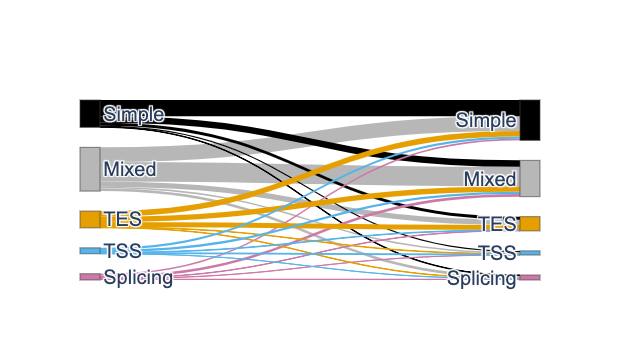

5201/12222 (42.55%) of genes have conserved sectors between human and mouse.


In [16]:
# major isoform triplets for just heart
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'heart'}
m_subset = {'tissue': 'heart'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/heart_mouse_v_human_triplets_sankey.pdf')

## non-major obs

284004
174572
26389
22326
22877
15045
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


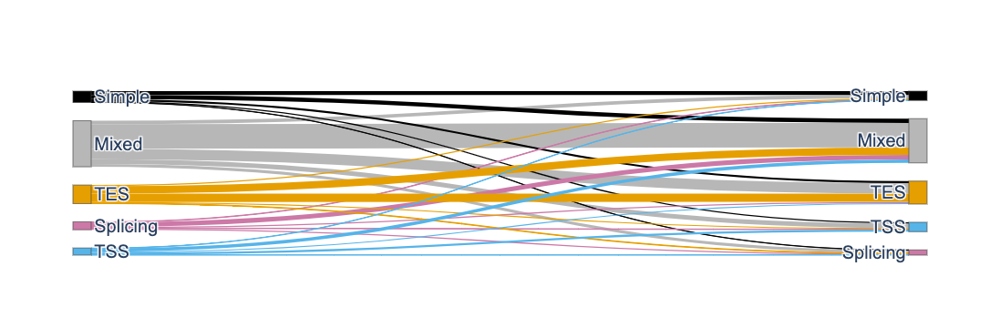

6601/15045 (43.88%) of genes have conserved sectors between human and mouse.


In [22]:
# observed triplets
h_source = 'obs_mm_det'
m_source = 'obs_det'

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      ofile='figures/obs_mouse_v_human_triplets_sankey.png')

In [ ]:
# major isoform triplets for just es
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'wtc11'}
m_subset = {'tissue': 'f1219'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset='protein_coding',
                      ofile='figures/es_mouse_v_human_triplets_sankey.png')

136002
12597

12597
11846
284004
174572
26389
10991
12002
8921
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


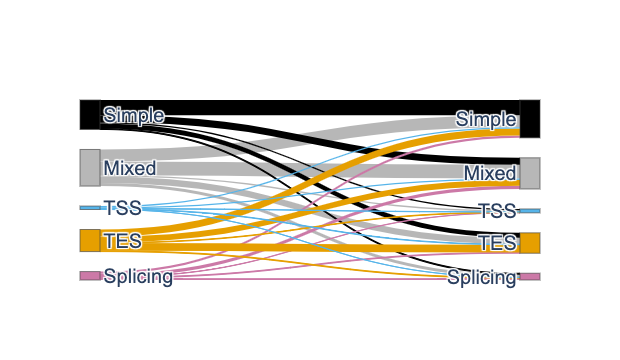

3464/8921 (38.83%) of genes have conserved sectors between human and mouse.


In [15]:
# major isoform triplets for just es
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'h9'}
m_subset = {'tissue': 'f1219'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      gene_subset=gene_subset,
                      ofile='figures/es_h9_mouse_v_human_triplets_sankey.png')

284004
174572
26389
18162
18118
12728
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


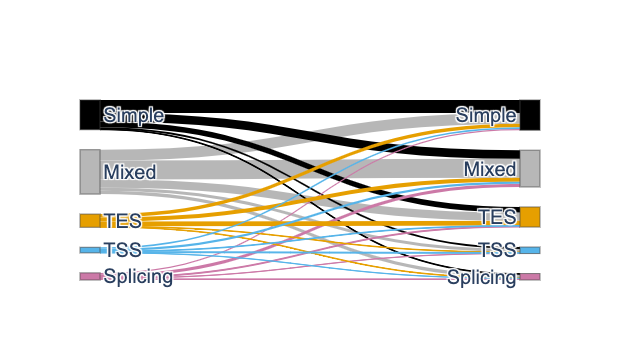

4974/12728 (39.08%) of genes have conserved sectors between human and mouse.


In [18]:
# major isoform triplets for just cortex
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'brain'}
m_subset = {'tissue': 'cortex'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      ofile='figures/cortex_mouse_v_human_triplets_sankey.png')

284004
174572
26389
12394
16815
10146
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


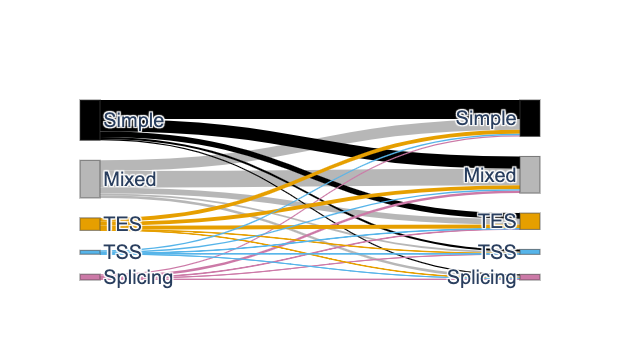

4218/10146 (41.57%) of genes have conserved sectors between human and mouse.


In [19]:
# major isoform triplets for just cortex
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'muscle'}
m_subset = {'tissue': 'gastroc'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      ofile='figures/muscle_mouse_v_human_triplets_sankey.png')

In [21]:
ca = cerberus.read(h_h5)
h_df = ca.triplets.loc[ca.triplets.source == h_source]

ca = cerberus.read(m_h5)
m_df = ca.triplets.loc[ca.triplets.source == m_source]

In [26]:
# h_df.loc[h_df['sample'].str.contains('adrenal')]

284004
174572
26389
15007
18986
11794
{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


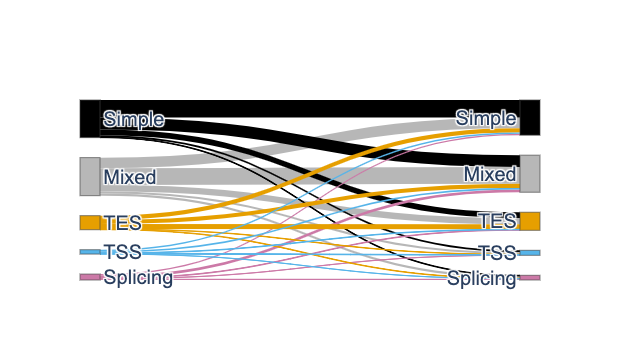

4848/11794 (41.11%) of genes have conserved sectors between human and mouse.


In [25]:
# major isoform triplets for just cortex
h_source = 'sample_major'
m_source = 'tissue_major'
h_subset = {'sample': 'adrenal gland'}
m_subset = {'tissue': 'adrenal'}

df = human_v_mouse_sectors(h_h5, m_h5,
                      h_source, m_source,
                      h_subset=h_subset,
                      m_subset=m_subset,
                      ofile='figures/muscle_mouse_v_human_triplets_sankey.png')

## Dev

In [3]:
# read in triplets
ca = cerberus.read(h5)
h_df = ca.triplets.loc[ca.triplets.source == source]

ca = cerberus.read(m_h5)
m_df = ca.triplets.loc[ca.triplets.source == m_source]

# get sectors for each gene
h_df = assign_gisx_sector(h_df)
m_df = assign_gisx_sector(m_df)

In [4]:
# add biotype info
gene_df, _, _ = get_gtf_info(how='gene', ver='v40_cerberus')
gene_df['gid'] = cerberus.get_stable_gid(gene_df, 'gid')
h_df = h_df.merge(gene_df[['gid', 'biotype_category']], how='left', on='gid')

gene_df, _, _ = get_gtf_info(how='gene', ver='vM25_cerberus')
gene_df['gid'] = cerberus.get_stable_gid(gene_df, 'gid')
m_df = m_df.merge(gene_df[['gid', 'biotype_category']], how='left', on='gid')

In [5]:
# # examine # of genes / biotype cat / sector
# h_df = h_df[['gid', 'sector', 'biotype_category']]
# h_df.groupby(['sector', 'biotype_category']).count()

# m_df = m_df[['gid', 'sector', 'biotype_category']]
# m_df.groupby(['sector', 'biotype_category']).count()

In [6]:
# matching gene ids b/w human and mouse
df = pd.read_csv('../../refs/biomart_human_to_mouse.tsv', sep='\t')
print(len(df.index))

gene_df, _, _ = get_gtf_info(how='gene', ver='v40_cerberus')
gene_df['gid_stable'] = cerberus.get_stable_gid(gene_df, 'gid')

284004


In [7]:
# how many human genes do we have that we detected in our human data?
print(len(gene_df.gid_stable.unique()))
print(len(df.loc[df['Gene stable ID'].isin(gene_df.gid_stable.unique().tolist())]['Gene stable ID'].unique().tolist()))

print(len(df['Gene stable ID'].unique()))
print(len(gene_df.loc[gene_df.gid_stable.isin(df['Gene stable ID'].unique().tolist())].gid_stable.unique().tolist()))

# how many genes are missing from the gid conversion table?
df.loc[~df['Gene stable ID'].isin(gene_df.gid_stable.unique().tolist())].head()

61544
61467
68005
61467


,Gene stable ID,Gene stable ID version,Transcript stable ID,Transcript stable ID version,Mouse gene stable ID,Mouse gene name
37,ENSG00000278457,ENSG00000278457.1,ENST00000620265,ENST00000620265.1,ENSMUSG00002075966,5S_rRNA
38,ENSG00000280538,ENSG00000280538.1,ENST00000630794,ENST00000630794.1,NaN,NaN
39,ENSG00000278704,ENSG00000278704.1,ENST00000618686,ENST00000618686.1,NaN,NaN
40,ENSG00000271254,ENSG00000271254.7,ENST00000614336,ENST00000614336.4,NaN,NaN
41,ENSG00000271254,ENSG00000271254.7,ENST00000612640,ENST00000612640.4,NaN,NaN


In [8]:
# get biotype info
df = df.merge(gene_df[['gid_stable', 'biotype_category']],
              how='left', left_on='Gene stable ID',
              right_on='gid_stable')
len(df.loc[df.gid_stable.isnull()]['Gene stable ID'].unique().tolist())              

df = df[['Gene stable ID', 'Mouse gene stable ID', 'biotype_category']]

print(len(df.index))

# drop dupes that are duplicated in both the human and mouse id (from transcripts)
df = df.drop_duplicates()
print(len(df.index))

df[['Gene stable ID', 'biotype_category']].groupby('biotype_category').nunique()

284004
74773


,Gene stable ID
biotype_category,
lncRNA,17723
miRNA,1877
other,7388
protein_coding,19959
pseudogene,14520


In [9]:
# drop nans in either mouse or human
df = df.loc[~df['Gene stable ID'].isnull()]
print(len(df.index))

df = df.loc[~df['Mouse gene stable ID'].isnull()]
print(len(df.index))

74773
26389


In [10]:
df[['Gene stable ID', 'biotype_category']].groupby('biotype_category').nunique()

,Gene stable ID
biotype_category,
lncRNA,2
miRNA,232
other,1378
protein_coding,17963
pseudogene,30


In [11]:
# merge human and mouse triplets in too
df = df.merge(h_df, how='right', left_on='Gene stable ID',
              right_on='gid')
print(len(df.index))

df = df.merge(m_df, how='right', left_on='Mouse gene stable ID',
              right_on='gid', suffixes=('_human', '_mouse'))
print(len(df.index))

22326
22563


In [12]:
print('human')
print(h_df[['gid', 'sector']].groupby('sector').nunique())
print('mouse')
print(m_df[['gid', 'sector']].groupby('sector').nunique())

human
           gid
sector        
mixed     8675
simple    6179
splicing  1382
tes       3468
tss       1323
mouse
           gid
sector        
mixed     8655
simple    6662
splicing   875
tes       4227
tss       1699


In [13]:
# get only genes that are both expressed
df = df.loc[~(df.sector_human.isnull())&~(df.sector_mouse.isnull())]
len(df.index)

14973

In [14]:
print('human')
print(df[['Gene stable ID', 'sector_human']].groupby('sector_human').nunique())
print('mouse')
print(df[['Mouse gene stable ID', 'sector_mouse']].groupby('sector_mouse').nunique())

len(df.loc[df['Gene stable ID'].duplicated(), 'Gene stable ID'].unique().tolist())
len(df.loc[df['Mouse gene stable ID'].duplicated(), 'Mouse gene stable ID'].unique().tolist())

human
              Gene stable ID
sector_human                
mixed                   7300
simple                  1715
splicing                1250
tes                     2931
tss                     1159
mouse
              Mouse gene stable ID
sector_mouse                      
mixed                         7087
simple                        1525
splicing                       793
tes                           3621
tss                           1502


329

In [15]:
# df.loc[df['Gene stable ID'].duplicated()].sort_values(by='Gene stable ID')
# df.loc[df['Mouse gene stable ID'].duplicated()].sort_values(by='Mouse gene stable ID')

In [16]:
# count up instances of each sector pair
df = df[['Gene stable ID', 'sector_human', 'sector_mouse']].groupby(['sector_human', 'sector_mouse']).count().reset_index()
df.rename({'Gene stable ID': 'n_genes'}, axis=1, inplace=True)

{'tss': '#56B4E9', 'splicing': '#CC79A7', 'tes': '#E69F00', 'simple': '#000000', 'mixed': '#b7b7b7'}


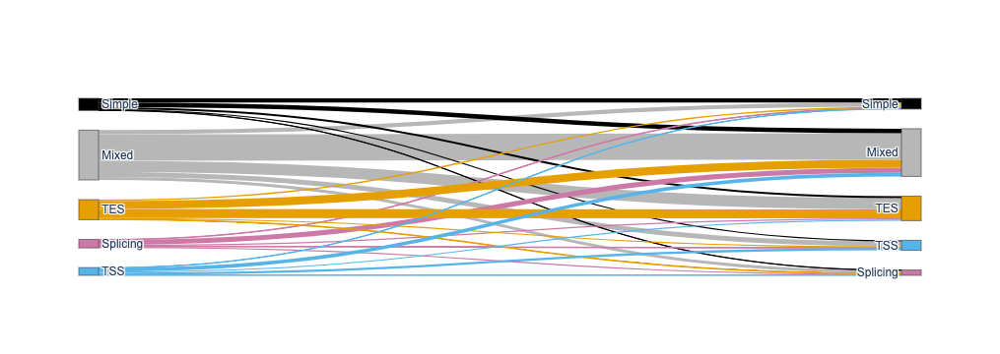

In [17]:
fig = plot_sankey(df,
                  source='sector_human',
                  sink='sector_mouse',
                  counts='n_genes',
                  color='sector',
                  title='')
# pio.write_image(fig, 'test.png', width=1500, height=775)

In [21]:
n_genes = df.n_genes.sum(axis=0)
n_cons_genes = df.loc[df.sector_human == df.sector_mouse].n_genes.sum(axis=0)
print('{}/{} ({:.2f}%) of shared, expresed, polyA genes have conserved sectors between human and mouse.'.format(n_cons_genes, n_genes, (n_cons_genes/n_genes)*100))

6559/14973 (43.81%) of shared, expresed, polyA genes have conserved sectors between human and mouse.
